E:\UNI\D_Drive\PhD\Year_1\2021_02_05_OwnOEDmcPaper\Scripts\PLac

# Import all packages

In [1]:
using DifferentialEquations
using OrdinaryDiffEq
using DiffEqBase
using Sundials
using ODEInterfaceDiffEq
using Plots
using Measures
using CSV
using DataFrames
using Turing
using MCMCChains
using EasyFit
using StatsPlots
using LinearAlgebra
using Random
using Distributions
using OrdinaryDiffEq
Random.seed!(145975);
using CmdStan
using KernelDensity
using LaTeXStrings
using StatsBase
using JLD2
using BlackBoxOptim
using BlackBoxOptim: num_func_evals

set_cmdstan_home!("C:\\cmdstan\\cmdstan-2.30.0");

┌ Warning: Environment variable CMDSTAN_HOME not set. Use set_cmdstan_home!.
└ @ CmdStan C:\Users\dgomez\.julia\packages\CmdStan\2vwWj\src\CmdStan.jl:27


In [2]:
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\BayesianInference\\FunctionsBayesInfs.jl")
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\InitalParameterFitPriorDef\\ModelFunctionsAll.jl")
include("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\FunctionsBayesOED.jl")

redSamples (generic function with 2 methods)

# Define True Theta and Bounds

In [3]:
trueP = [48.0, 55.0,0.005911,0.01832,0.042171,0.5365,0.98047,0.991257,0.93335,0.008241,0.9943848,0.001974,   15];

bounds = [[48, 55, 0.001, 0.005, 0.01, 0.1, 0.7, 0.7, 0.7, 0.005, 0.7, 0.0008, 15],
          [48, 55, 0.01, 0.05, 0.08, 0.8, 1.2, 1.2, 1.2, 0.012, 1.2, 0.005, 15]];


InitsY0 = [450, 12599, 226];

boundY0 = [[300, 7000, 100],
           [1000, 25000, 1000]];

# Generate Pseudodata

## Define Experimental Details

In [4]:
Nexp = 4;

Random.seed!(46597557);
PyrCons = round.(rand(Uniform(0,40), Nexp), digits = 1).*1000

4-element Vector{Float64}:
  4900.0
 30400.0
 10400.0
 16000.0

In [5]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));

In [6]:
tsC2 = dat32mM[:,1]
ts = 0:tsC2[end];

ivssAll = Array{Any}(undef, Nexp);
for i in 1:Nexp
    ivssAll[i] = [PyrCons[i], 0, 0, InitsY0[1], InitsY0[2], InitsY0[3], 0, 0, 0, 0, 0, PyrCons[i], 0, PyrCons[i]*(trueP[end]*0.12)];;
end
samps = convert.(Int, tsC2);


## Simulate Experiments and Extract Observables

In [7]:
SimulsAll = Array{Any}(undef, Nexp,3);
for i in 1:Nexp
    SimulsAll[i,1], SimulsAll[i,2], SimulsAll[i,3]  = PyruvateHP_NMR_SolveAllCp(ts, vcat(trueP, 0), ivssAll[i], samps);
end

In [8]:
ObsS = Array{Any}(undef, Nexp,2);
for i in 1:Nexp
    ObsS[i,1] = SimulsAll[i,1][:,14,1]; # Pyruvate HP
    ObsS[i,2] = SimulsAll[i,1][:,13,1]; # Lactate HP
end


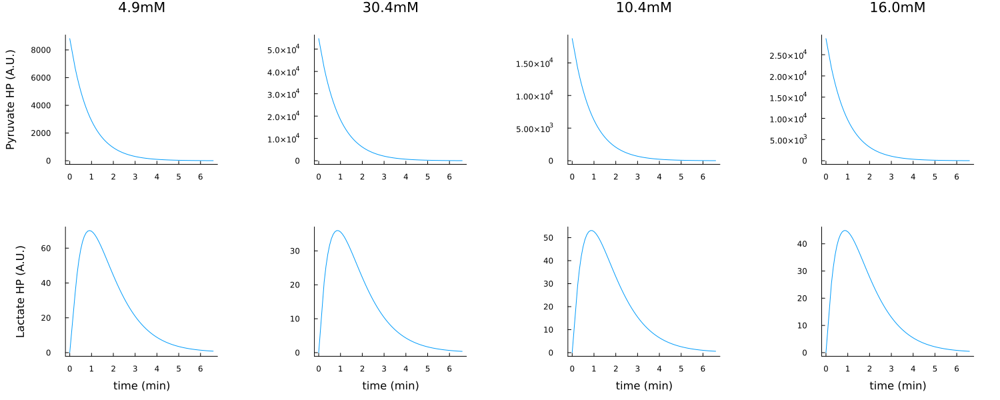

In [9]:
pp1 = plot(samps./60, ObsS[1,1], label = "", title = string(PyrCons[1]/1000)*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, ObsS[1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, ObsS[2,1], label = "", title = string(PyrCons[2]/1000)*"mM")
pp2 = plot(samps./60, ObsS[2,2], label = "", xlabel = "time (min)")

PP2 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, ObsS[3,1], label = "", title = string(PyrCons[3]/1000)*"mM")
pp2 = plot(samps./60, ObsS[3,2], label = "", xlabel = "time (min)")

PP3 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, ObsS[4,1], label = "", title = string(PyrCons[4]/1000)*"mM")
pp2 = plot(samps./60, ObsS[4,2], label = "", xlabel = "time (min)")

PP4 = plot(pp1,pp2, layout = (2,1))

plot(PP1, PP2, PP3, PP4, layout = (1,4), grid = false, size = (1500,600), margin = 8mm)

## Simulate Noise

In [10]:
sigm1=0.12; # 10% additive heteroscedastic noise
sigm2=0.075;


Random.seed!(45659211); 

SolN1NoiseHet = zeros(length(samps),Nexp,2);
basemat = zeros(length(samps),Nexp,2);

i = 1

for i in 1:Nexp
    basemat[:,i,1] = ObsS[i,1]'.*sigm1; # introduce new diagonal matrices
    basemat[:,i,2] = ObsS[i,2]'.*sigm2;

    for zer in collect(1:length(samps)) # To avoid having standard deviations of 0
        if basemat[zer,i,1]<=1
            basemat[zer,i,1] = 1;
        end
        if basemat[zer,i,2]<=1
            basemat[zer,i,2] = 1;
        end
    end

    SolN1NoiseHet[:,i, 1] = ObsS[i,1]#+rand(MvNormal(zeros(length(samps)),basemat[:,i,1]));
    SolN1NoiseHet[:,i, 2] = ObsS[i,2]+rand(MvNormal(zeros(length(samps)),basemat[:,i,2]));
    SolN1NoiseHet[1,i, 2] = 0;
end

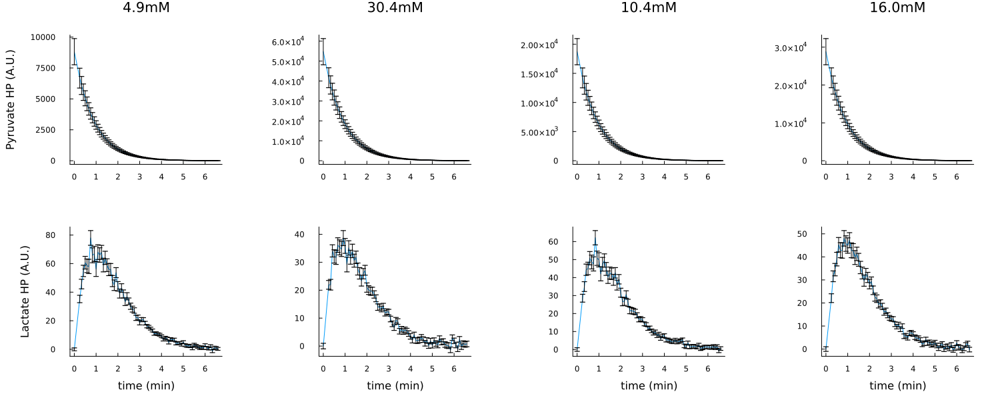

In [11]:
pp1 = plot(samps./60, SolN1NoiseHet[:,1, 1], yerror = basemat[:,1,1], label = "", title = string(PyrCons[1]/1000)*"mM", ylabel = "Pyruvate HP (A.U.)")
pp2 = plot(samps./60, SolN1NoiseHet[:,1, 2], yerror = basemat[:,1,2], label = "", ylabel = "Lactate HP (A.U.)", xlabel = "time (min)")

PP1 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, SolN1NoiseHet[:,2, 1], yerror = basemat[:,2,1], label = "", title = string(PyrCons[2]/1000)*"mM")
pp2 = plot(samps./60, SolN1NoiseHet[:,2, 2], yerror = basemat[:,2,2], label = "", xlabel = "time (min)")

PP2 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, SolN1NoiseHet[:,3, 1], yerror = basemat[:,3,1], label = "", title = string(PyrCons[3]/1000)*"mM")
pp2 = plot(samps./60, SolN1NoiseHet[:,3, 2], yerror = basemat[:,3,2], label = "", xlabel = "time (min)")

PP3 = plot(pp1,pp2, layout = (2,1))

pp1 = plot(samps./60, SolN1NoiseHet[:,4, 1], yerror = basemat[:,4,1], label = "", title = string(PyrCons[4]/1000)*"mM")
pp2 = plot(samps./60, SolN1NoiseHet[:,4, 2], yerror = basemat[:,4,2], label = "", xlabel = "time (min)")

PP4 = plot(pp1,pp2, layout = (2,1))

plot(PP1, PP2, PP3, PP4, layout = (1,4), grid = false, size = (1500,600), margin = 8mm)

## Generate CSV Files For PseudoData

In [12]:
# Observables
for i in 1:Nexp
    Observables = zeros(length(samps),5);
    Observables[:,1] = samps;
    Observables[:,2] = SolN1NoiseHet[:,i, 1];
    Observables[:,3] = basemat[:,i, 1];
    Observables[:,4] = SolN1NoiseHet[:,i, 2];
    Observables[:,5] = basemat[:,i, 2];
    obs_head = ["time","Pyr_MEAN","Pyr_STD","Lac_MEAN","Lac_STD"];

    df1 = DataFrame(Observables, :auto);
    rename!(df1, [obs_head[i] for i in 1:5]);
    CSV.write(string("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\CompRepr_Ran",i,"_Observables_Pyr",string(string(PyrCons[i]/1000)),"mM.csv"), df1);
end

## Compute Utility Function of Experiment

In [12]:
NSamps = 1000;

priorTheta = Array{Any}(undef, 13);
priotY0 = Array{Any}(undef, 3);

priorTheta[1] = Normal(40.92, 10); priorTheta[2] = Normal(51.23, 10); priorTheta[3] = Truncated(Normal(0.0055, 0.00275), 0,2); priorTheta[4] = Truncated(Normal(0.0275, 0.01375), 0,2); 
priorTheta[5] = Truncated(Normal(0.045, 0.0225), 0,2); priorTheta[6] = Truncated(Normal(0.45, 0.225), 0,2); priorTheta[7] = Truncated(Normal(0.95, 0.475), 0,2); 
priorTheta[8] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[9] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[10] = Truncated(Normal(0.0085, 0.00425), 0,2);
priorTheta[11] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[12] = Truncated(Normal(0.0029, 0.00145), 0,2); priorTheta[13] = Normal(18.5, 2.29);

priotY0[1] = Truncated(Normal(650, 260), 0, 1600); priotY0[2] = Truncated(Normal(16000, 6400), 0, 4e4); priotY0[3] = Truncated(Normal(550, 275), 0, 1600);
global sampsTh = zeros(NSamps, 13);
global sampsY0 = zeros(NSamps, 3);

Random.seed!(687865443); 

for i in 1:13
    sampsTh[:,i] = rand(priorTheta[i], NSamps);
end
for i in 1:3
    sampsY0[:,i] = rand(priotY0[i], NSamps);
end
sampsTh[:,1] .= 48;
sampsTh[:,2] .= 55;
sampsTh[:,13] .= 15;

global tsC2 = dat32mM[:,1]
global ts = 0:tsC2[end];
global samps = convert.(Int, tsC2);


In [16]:
CompRepUtil_Entro_OEDmc([PyrCons[1]/1000])

354.60592410688304

# Bayesian Inference 1

## Extract Data

In [17]:
mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\";
i = 1;
paths = [mainpath*"CompRepr_Ran"*string(i)*"_Observables_Pyr"*(string(PyrCons[i]/1000))*"mM.csv"]

1-element Vector{String}:
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 74 bytes ⋯ "r_Ran1_Observables_Pyr4.9mM.csv"

In [18]:
Random.seed!(231549);
global dat = restructDatInfCompRep_FixedSF(paths, rand(Uniform(boundY0[1][1],boundY0[2][1])), rand(Uniform(boundY0[1][2],boundY0[2][2])), rand(Uniform(boundY0[1][3],boundY0[2][3])), 15)

Dict{String, Any} with 14 entries:
  "Means"  => [8820.0; 6679.61; … ; 5.9485; 5.40366;;; 0.0; 35.2364; … ; 1.0102…
  "stsl"   => [78;;]
  "obSta"  => [1 2]
  "sts"    => [0; 15; … ; 390; 395;;]
  "obser"  => 2
  "Y0us"   => [4900.0; 0.0; … ; 0.0; 8820.0;;]
  "ts"     => [1.0e-20; 1.0; … ; 394.0; 395.0;;]
  "itp"    => [0.0]
  "ncells" => [0;;]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [1058.4; 801.553; … ; 1.0; 1.0;;; 1.0; 2.5872; … ; 1.0; 1.0]
  "m"      => 1
  "nts"    => [395;;]

## Prior Prediction

In [19]:
priorTheta = Array{Any}(undef, 13);
priotY0 = Array{Any}(undef, 3);

priotY0[1] = Truncated(Normal(650, 260), 0, 1500);
priotY0[2] = Truncated(Normal(16000, 6400), 0, 4e4);
priotY0[3] = Truncated(Normal(550, 275), 0, 2000);

priorTheta[1] = Normal(40.92, 10); priorTheta[2] = Normal(51.23, 10); priorTheta[3] = Truncated(Normal(0.0055, 0.00275), 0,2); priorTheta[4] = Truncated(Normal(0.0275, 0.01375), 0,2); 
priorTheta[5] = Truncated(Normal(0.045, 0.0225), 0,2); priorTheta[6] = Truncated(Normal(0.45, 0.225), 0,2); priorTheta[7] = Truncated(Normal(0.95, 0.475), 0,2); 
priorTheta[8] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[9] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[10] = Truncated(Normal(0.0085, 0.00425), 0,2);
priorTheta[11] = Truncated(Normal(0.95, 0.475), 0,2); priorTheta[12] = Truncated(Normal(0.0029, 0.00145), 0,2); priorTheta[13] = Normal(18.5, 2.29);

In [20]:
sampsTh = zeros(8000, 13);
sampsY0 = zeros(8000, 3);

Random.seed!(657986354); 

for i in 1:13
    sampsTh[:,i] = rand(priorTheta[i], 8000);
end
for i in 1:3
    sampsY0[:,i] = rand(priotY0[i], 8000);
end

In [21]:
sampsTh[:,1] .= 48;
sampsTh[:,2] .= 55;
sampsTh[:,13] .= 15;

In [22]:
simsPrior = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,1,1]/(sampsTh[i,end]*0.12), 0, 0, sampsY0[i,1], sampsY0[i,1], sampsY0[i,1], 0, 0, 0, 0, 0, dat["Means"][1,1,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,1,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(sampsTh[i,1:end], 0), ivss, samps);

    simsPrior[i] = SimulsAll;
end

In [23]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,1,1);
lacPirorSims = zeros(size(simsPrior[1])[1], 8000)
[lacPirorSims[:,i] = simsPrior[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PriorQuant[1,k,m] = [percentile(lacPirorSims[j,:], 99.5) for j in 1:size(lacPirorSims)[1]]; # Up
        PriorQuant[2,k,m] = [percentile(lacPirorSims[j,:], 0.5 ) for j in 1:size(lacPirorSims)[1]]; # Down
    end
end


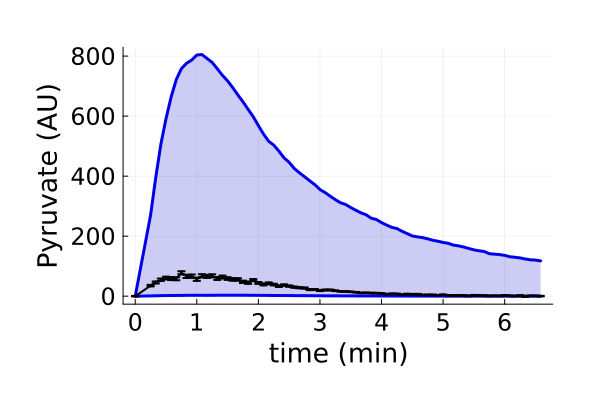

In [24]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"]./60, dat["Means"][:,1,2], yerror = dat["Erros"][:,1,2], linewidth = 2, colour = "black", label = "")

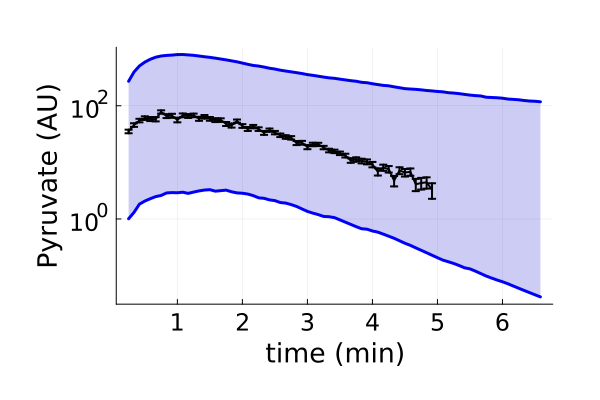

In [20]:
pr = plot(tsC2[2:end]./60, PriorQuant[1][2:end], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2[2:end]./60, PriorQuant[2][2:end], label = "", color = "blue", linewidth = 3)
  plot!(tsC2[2:end]./60, PriorQuant[1][2:end], fillrange=PriorQuant[2][2:end], label="", color="blue3", fillalpha=0.2, yaxis=:log)

  plot!(dat["sts"][2:end-20]./60, dat["Means"][:,1,2][2:end-20], yerror = dat["Erros"][:,1,2][2:end-20], linewidth = 2, colour = "black", label = "", yaxis=:log)

  
display(pr)

## MLE to obtain a good first guess for inference

In [20]:
function ObjectFunctMECp_MLE(p)

    # Define parameter vectors for each amount of cells (last parameter is a time delay, not used in here)
    pD2 = vcat(p[1:end-3], 0);

    # Define time vector
    t2cor = dat["sts"];

    # Define equaly-spaced time vector
    ts1 = collect(0:t2cor[end]);

    # Define initial value for simulation (use of experimental mean)
    ivss1 = [dat["Means"][1,1,1]/(ScFm*0.12), 0, dat["Means"][1,1,2]/(ScFm*0.12), p[end-2], p[end-1], p[end], 0, 0, 0, 0, 0, dat["Means"][1,1,1]/(ScFm*0.12), dat["Means"][1,1,2], dat["Means"][1,1,1]];

    # Convert sampling vector to integer to extract correct elements from simulation
    samps1 = convert.(Int, t2cor);

    # Simulate
    SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts1, pD2, ivss1, samps1);
    
    mm22 = sum((-1/2) .* (log(2*pi) .+ log.(dat["Erros"][:,1,2].^2) .+ ((SimOnTime1[:,13] .- dat["Means"][:,1,2]).^2)./(dat["Erros"][:,1,2].^2)));

    # obj = (mm21+mm22)*(mm11+mm12);
    if p[end-2] >= p[end-1]
        mm22 = mm22*10;
    end
    obj = -(mm22);

    
    return(obj)

end


function ObjectFunctMECp_Multi_MLE(p)

    # Define parameter vectors for each amount of cells (last parameter is a time delay, not used in here)
    pD2 = vcat(p[1:end-3], 0);
    obj = 0;
    
    for i in 1:length(dat["stsl"])
        # Define time vector
        t2cor = dat["sts"][:,i];

        # Define equaly-spaced time vector
        ts1 = collect(0:t2cor[end]);

        # Define initial value for simulation (use of experimental mean)
        ivss1 = [dat["Means"][1,i,1]/(ScFm*0.12), 0, dat["Means"][1,i,2]/(ScFm*0.12), p[end-2], p[end-1], p[end], 0, 0, 0, 0, 0, dat["Means"][1,i,1]/(ScFm*0.12), dat["Means"][1,i,2], dat["Means"][1,i,1]];

        # Convert sampling vector to integer to extract correct elements from simulation
        samps1 = convert.(Int, t2cor);

        # Simulate
        SimOnTime1, SimOffTime1, SimAll1  = PyruvateHP_NMR_SolveAllCp(ts1, pD2, ivss1, samps1);
    
        mm22 = sum((-1/2) .* (log(2*pi) .+ log.(dat["Erros"][:,i,2].^2) .+ ((SimOnTime1[:,13] .- dat["Means"][:,i,2]).^2)./(dat["Erros"][:,i,2].^2)));

        # obj = (mm21+mm22)*(mm11+mm12);
        if p[end-2] >= p[end-1]
            mm22 = mm22*10;
        end
        obj = -(mm22)+obj;
    end
    
    return(obj)

end


ObjectFunctMECp_Multi_MLE (generic function with 1 method)

In [25]:
global ScFm = 15;
p = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-1, 1e-6, 15, 50/(15*0.12), 5000/(15*0.12), 700/(15*0.12)];
ObjectFunctMECp_Multi_MLE(p)

UndefVarError: UndefVarError: `ObjectFunctMECp_Multi_MLE` not defined

In [23]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

In [26]:
i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMECp_Multi_MLE; SearchRange = vcat([(bounds[1][i], bounds[2][i]) for i in 1:13], [(boundY0[1][i], boundY0[2][i]) for i in 1:3]), # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*1, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.50 secs, 79 evals, 45 steps, improv/step: 0.578 (last = 0.5778), fitness=178.953377771
1.00 secs, 150 evals, 97 steps, improv/step: 0.536 (last = 0.5000), fitness=178.953377771
1.51 secs, 246 evals, 175 steps, improv/step: 0.480 (last = 0.4103), fitness=178.953377771
2.01 secs, 369 evals, 295 steps, improv/step: 0.427 (last = 0.3500), fitness=178.953377771
2.51 secs, 478 evals, 405 steps, improv/step: 0.385 (last = 0.2727), fitness=178.936270678
3.05 secs, 580 evals, 509 steps, improv/step: 0.365 (last = 0.2885), fitness=155.655976087
3.55 secs, 699 evals, 631 steps, improv/step: 0.345 (last = 0.2623), fitness=153.256990937
4.05 secs, 811 evals, 744 steps, improv/step: 0.332 (last = 0.2566), fitness=153.256990937
4.61 secs, 928 evals, 863 steps, improv/step: 0.316 (last = 0.2185), fi

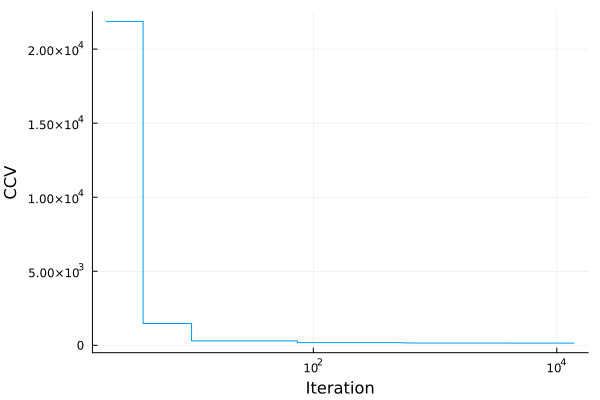

In [27]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
display(pl)

In [28]:
parfitT = zeros(16, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))
ppT = parfitT[:,bestPind]

16-element Vector{Float64}:
   48.0
   55.0
    0.005953029836793238
    0.0182475812914032
    0.0649714941905647
    0.11174781645059415
    1.194450009655639
    0.7702770259213169
    1.1729194119923703
    0.00664469541631548
    0.934397939178647
    0.0008020193695231474
   15.0
  772.2317338839449
 7616.307158389608
  108.60168280676977

In [29]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMTRRCmp_ScF_Rand1.jld2", "FitsT",FitsT)
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_Rand1.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

In [26]:
ppT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_Rand1.jld2")["resMMat"][:,1]


16-element Vector{Float64}:
   48.0
   55.0
    0.005953029836793238
    0.0182475812914032
    0.0649714941905647
    0.11174781645059415
    1.194450009655639
    0.7702770259213169
    1.1729194119923703
    0.00664469541631548
    0.934397939178647
    0.0008020193695231474
   15.0
  772.2317338839449
 7616.307158389608
  108.60168280676977

## Compute structure for Stan's initial guess

In [27]:
preTrans = zeros(13);

preTrans[1] = (ppT[3]-0.0055)/0.00275; 
preTrans[2] = (ppT[4]-0.0275)/0.01375;          
preTrans[3] = (ppT[5]-0.045)/0.0225;
preTrans[4] = (ppT[6]-0.45)/0.225;
preTrans[5] = (ppT[7]-0.95)/0.475;
preTrans[6] = (ppT[8]-0.95)/0.475;
preTrans[7] = (ppT[9]-0.95)/0.475;
preTrans[8] = (ppT[10]-0.0085)/0.00425;
preTrans[9] = (ppT[11]-0.95)/0.475;
preTrans[10] = (ppT[12]-0.0029)/0.00145;


preTrans[11] = (ppT[14]-650)/260;
preTrans[12] = (ppT[15]-16000)/6400;
preTrans[13] = (ppT[16]-550)/275;

In [28]:
function genStanInitDict(samps, names, chains)
    alltog = Array{Dict{String,Any},1}(undef,chains);
    for i in 1:(chains)
        global tmp = Dict{String, Any}()
        for j in 1:length(names)
            tmp[names[j]] = samps[j,i];
        end
        alltog[i] = tmp
    end

    return(alltog)
end

samps = hcat(preTrans,preTrans,preTrans,preTrans);
names = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

ini = genStanInitDict(samps, names, 4)

4-element Vector{Dict{String, Any}}:
 Dict("kbnE" => -0.436542254984593, "LDH" => -1.6050847897935645, "kin" => 0.1647381224702686, "ki" => -0.03284644383442728, "kunE" => 0.4693040252470954, "kpl" => -0.6729031788070401, "NADH" => 0.47012205339978813, "kup" => -0.37836415595512235, "kbp" => 0.5146315992750295, "kr" => -1.446883193432312…)
 Dict("kbnE" => -0.436542254984593, "LDH" => -1.6050847897935645, "kin" => 0.1647381224702686, "ki" => -0.03284644383442728, "kunE" => 0.4693040252470954, "kpl" => -0.6729031788070401, "NADH" => 0.47012205339978813, "kup" => -0.37836415595512235, "kbp" => 0.5146315992750295, "kr" => -1.446883193432312…)
 Dict("kbnE" => -0.436542254984593, "LDH" => -1.6050847897935645, "kin" => 0.1647381224702686, "ki" => -0.03284644383442728, "kunE" => 0.4693040252470954, "kpl" => -0.6729031788070401, "NADH" => 0.47012205339978813, "kup" => -0.37836415595512235, "kbp" => 0.5146315992750295, "kr" => -1.446883193432312…)
 Dict("kbnE" => -0.436542254984593, "LDH" => -1.

## Inference

In [27]:
modelpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\HP_PyrLac_CompetitiveRepressionModel_FixedT1ScF.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrCompRepr_Rand1_Try1", model=Model, nchains =4,
            num_samples  = 2000, num_warmup = 1000, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 0.1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [28]:
rc, chns, cnames = stan(StanModel, dat, init = ini) 


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -4: 
Convergence test failures occurred too many times during one internal time step or minimum step size was reached. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessingInference/ComputationalBayesianOED/tmp/PyrCompRepr_Rand1_Try1.stan', line 198, column 6 to column 133)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in '

Inference for Stan model: PyrCompRepr_Rand1_Try1_model
4 chains: each with iter=(2000,2000,2000,2000); warmup=(1000,1000,1000,1000); thin=(1,1,1,1); 12000 iterations saved.

Warmup took (103017, 95264, 102578, 114111) seconds, 115 hours total
Sampling took (160914, 182275, 223547, 213816) seconds, 217 hours total

                    Mean     MCSE   StdDev        5%       50%       95%    N_Eff  N_Eff/s    R_hat

lp__            -1.6e+02  4.1e-02  2.4e+00  -1.6e+02  -1.6e+02  -1.5e+02  3.4e+03  4.3e-03  1.0e+00
accept_stat__    9.0e-01  2.5e-02  1.9e-01   4.9e-01   9.8e-01      1.00       58  7.4e-05      1.0
stepsize__       7.4e-03  1.1e-03  2.6e-03   3.6e-03   7.1e-03     0.012      5.8  7.4e-06      1.2
treedepth__      8.7e+00  2.9e-01  1.3e+00   7.0e+00   9.0e+00        10       20  2.6e-05      1.1
n_leapfrog__     5.8e+02  8.1e+01  2.9e+02   1.8e+02   5.1e+02      1023       13  1.6e-05      1.1
divergent__      6.2e-02  4.2e-03  2.4e-01   0.0e+00   0.0e+00       1.0     3230  

(0, [-154.406 0.962437 … 19242.1 132.482; -154.406 0.0 … 19242.1 132.482; … ; -155.641 0.85039 … 16796.4 204.565; -155.071 0.957039 … 14610.5 209.664;;; -155.362 0.978797 … 21533.6 161.32; -155.362 0.0 … 21533.6 161.32; … ; -156.78 0.99812 … 11465.2 137.524; -157.003 0.933661 … 10518.8 288.51;;; -155.969 0.885821 … 16492.8 397.517; -155.969 0.0 … 16492.8 397.517; … ; -157.162 0.999284 … 11935.1 210.413; -158.762 0.972694 … 12807.5 179.918;;; -157.277 0.999067 … 20362.3 505.248; -157.277 0.0 … 20362.3 505.248; … ; -157.404 0.999629 … 22239.5 150.983; -155.923 0.91459 … 20427.7 392.395], ["lp__", "accept_stat__", "stepsize__", "treedepth__", "n_leapfrog__", "divergent__", "energy__", "kin", "kpl", "kbn"  …  "theta.7", "theta.8", "theta.9", "theta.10", "theta.11", "theta.12", "theta.13", "inits.1", "inits.2", "inits.3"])

In [32]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PyrCompetitiveRepressionInferRes_Rand1_Try1.jld", "rc", rc, "chns", chns, "cnames", cnames)

In [33]:
poster = vcat(chns[1001:end, end-15:end, 1], chns[1001:end, end-15:end, 2], chns[1001:end, end-15:end, 3], chns[1001:end, end-15:end, 4])
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand1_Try1.jld", "poster", poster)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand1_Try1.csv", DataFrame(poster, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand1_Try1.csv"

In [29]:
poster = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand1_Try1.csv", DataFrame))

8000×16 Matrix{Float64}:
 48.0  55.0  0.00769345  0.0179083  …  15.0   514.02   14384.3   155.291
 48.0  55.0  0.00736386  0.0175962     15.0   308.074  19681.4   216.849
 48.0  55.0  0.0046013   0.0182119     15.0   620.034  10541.3   124.946
 48.0  55.0  0.004618    0.0182073     15.0   617.429  10714.3   128.532
 48.0  55.0  0.00406985  0.0181843     15.0   581.726  11239.0   115.466
 48.0  55.0  0.0114009   0.0179999  …  15.0   500.002  27214.8   546.045
 48.0  55.0  0.0134451   0.0182808     15.0   756.282  27277.4   486.31
 48.0  55.0  0.00662211  0.017769      15.0   595.669  12101.4   233.699
 48.0  55.0  0.00656866  0.0181895     15.0   373.765  16803.7   251.97
 48.0  55.0  0.00838059  0.0169613     15.0   725.442  12913.1   517.64
  ⋮                                 ⋱                              ⋮
 48.0  55.0  0.00904607  0.0170762     15.0   485.618  14967.0   354.169
 48.0  55.0  0.0049884   0.0182374     15.0   484.617  23132.6   115.196
 48.0  55.0  0.00586615  0.017846

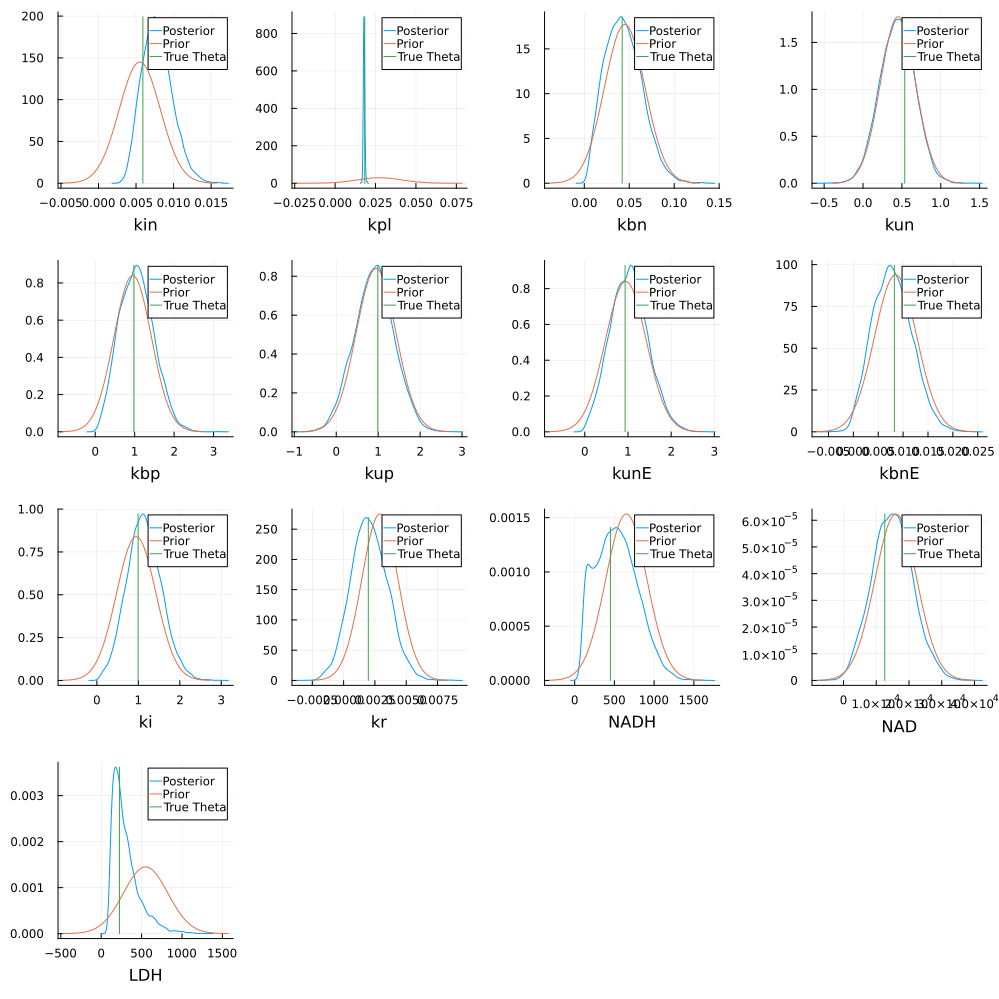

In [30]:
pp1 = plot(kde(poster[:,3]), label = "Posterior", xlabel = names[1])
plot!(Normal(0.0055, 0.00275), label = "Prior")
plot!([trueP[3], trueP[3]],[0, maximum(kde(poster[:,3]).density)], label = "True Theta")

pp2 = plot(kde(poster[:,4]), label = "Posterior", xlabel = names[2])
plot!(Normal(0.0275, 0.01375), label = "Prior")
plot!([trueP[4], trueP[4]],[0, maximum(kde(poster[:,4]).density)], label = "True Theta")

pp3 = plot(kde(poster[:,5]), label = "Posterior", xlabel = names[3])
plot!(Normal(0.045, 0.0225), label = "Prior")
plot!([trueP[5], trueP[5]],[0, maximum(kde(poster[:,5]).density)], label = "True Theta")

pp4 = plot(kde(poster[:,6]), label = "Posterior", xlabel = names[4])
plot!(Normal(0.45, 0.225), label = "Prior")
plot!([trueP[6], trueP[6]],[0, maximum(kde(poster[:,6]).density)], label = "True Theta")

pp5 = plot(kde(poster[:,7]), label = "Posterior", xlabel = names[5])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[7], trueP[7]],[0, maximum(kde(poster[:,7]).density)], label = "True Theta")

pp6 = plot(kde(poster[:,8]), label = "Posterior", xlabel = names[6])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[8], trueP[8]],[0, maximum(kde(poster[:,8]).density)], label = "True Theta")

pp7 = plot(kde(poster[:,9]), label = "Posterior", xlabel = names[7])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[9], trueP[9]],[0, maximum(kde(poster[:,9]).density)], label = "True Theta")

pp8 = plot(kde(poster[:,10]), label = "Posterior", xlabel = names[8])
plot!(Normal(0.0085, 0.00425), label = "Prior")
plot!([trueP[10], trueP[10]],[0, maximum(kde(poster[:,10]).density)], label = "True Theta")

pp9 = plot(kde(poster[:,11]), label = "Posterior", xlabel = names[9])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[11], trueP[11]],[0, maximum(kde(poster[:,11]).density)], label = "True Theta")

pp10 = plot(kde(poster[:,12]), label = "Posterior", xlabel = names[10])
plot!(Normal(0.0029, 0.00145), label = "Prior")
plot!([trueP[12], trueP[12]],[0, maximum(kde(poster[:,12]).density)], label = "True Theta")


pp11 = plot(kde(poster[:,14]), label = "Posterior", xlabel = names[11])
plot!(Normal(650, 260), label = "Prior")
plot!([InitsY0[1], InitsY0[1]],[0, maximum(kde(poster[:,14]).density)], label = "True Theta")

pp12 = plot(kde(poster[:,15]), label = "Posterior", xlabel = names[12])
plot!(Normal(16000, 6400), label = "Prior")
plot!([InitsY0[2], InitsY0[2]],[0, maximum(kde(poster[:,15]).density)], label = "True Theta")

pp13 = plot(kde(poster[:,16]), label = "Posterior", xlabel = names[13])
plot!(Normal(550, 275), label = "Prior")
plot!([InitsY0[3], InitsY0[3]],[0, maximum(kde(poster[:,16]).density)], label = "True Theta")

plot(pp1,pp2,pp3,pp4,pp5,pp6,pp7,pp8,pp9,pp10,pp11,pp12,pp13, size=(1000,1000))

In [29]:
-log(det(cov(hcat(poster[:,3:12], poster[:,14:end]))))

32.25430113954863

## Simulate Experiment Current Posterior

In [31]:
simsPoster = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,1,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,1,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,1,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPoster[i] = SimulsAll;
end

In [32]:
# Dims = Up/Down, Observable, Experiment
PostQuant = Array{Any}(undef,2,1,1);
lacPostSims = zeros(size(simsPoster[1])[1], 8000)
[lacPostSims[:,i] = simsPoster[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PostQuant[1,k,m] = [percentile(lacPostSims[j,:], 99.5) for j in 1:size(lacPostSims)[1]]; # Up
        PostQuant[2,k,m] = [percentile(lacPostSims[j,:], 0.5 ) for j in 1:size(lacPostSims)[1]]; # Down
    end
end


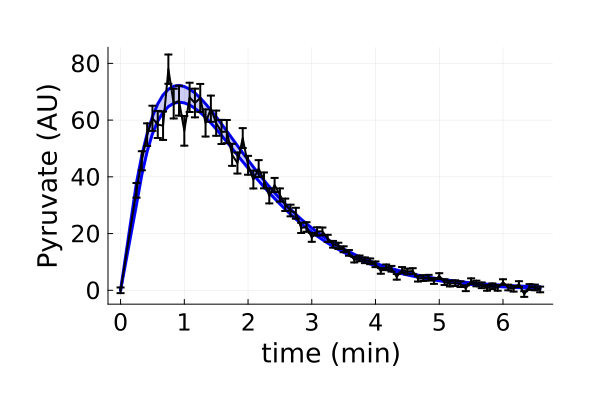

In [33]:
pr = plot(tsC2./60, PostQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PostQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PostQuant[1], fillrange=PostQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"]./60, dat["Means"][:,1,2], yerror = dat["Erros"][:,1,2], linewidth = 2, colour = "black", label = "")

## Compute Utility Function of Experiment

In [34]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
global tsC2 = dat32mM[:,1]
global ts = 0:tsC2[end];
global samps = convert.(Int, tsC2);
global sampsTh = abs.(poster[:,1:13]);
global sampsY0 = abs.(poster[:,14:end]);

In [35]:
CompRepUtil_Entro_OEDmc(PyrCons[2]/1000)

149.16303325924022

# Bayesian Inference 2

## Extract Data

In [36]:
mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\";
i = 2;
paths = [mainpath*"CompRepr_Ran"*string(1)*"_Observables_Pyr"*(string(PyrCons[1]/1000))*"mM.csv",
         mainpath*"CompRepr_Ran"*string(2)*"_Observables_Pyr"*(string(PyrCons[2]/1000))*"mM.csv"]

2-element Vector{String}:
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 74 bytes ⋯ "r_Ran1_Observables_Pyr4.9mM.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 75 bytes ⋯ "_Ran2_Observables_Pyr30.4mM.csv"

In [37]:
Random.seed!(231549);
global dat = restructDatInfCompRep_FixedSF(paths, rand(Uniform(boundY0[1][1],boundY0[2][1])), rand(Uniform(boundY0[1][2],boundY0[2][2])), rand(Uniform(boundY0[1][3],boundY0[2][3])), 15)

Dict{String, Any} with 14 entries:
  "Means"  => [8820.0 54720.0; 6679.61 41637.2; … ; 5.9485 44.9213; 5.40366 41.…
  "stsl"   => [78 78]
  "obSta"  => [1 2]
  "sts"    => [0 0; 15 15; … ; 390 390; 395 395]
  "obser"  => 2
  "Y0us"   => [4900.0 30400.0; 0.0 0.0; … ; 0.0 0.0; 8820.0 54720.0]
  "ts"     => [1.0e-20 1.0e-20; 1.0 1.0; … ; 394.0 394.0; 395.0 395.0]
  "itp"    => [0.0, 0.0]
  "ncells" => [0 0]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [1058.4 6566.4; 801.553 4996.46; … ; 1.0 5.39055; 1.0 4.92099;;; …
  "m"      => 2
  "nts"    => [395 395]

## Prior Prediction

In [38]:
simsPrior = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,end,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPrior[i] = SimulsAll;
end

In [39]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,1,1);
lacPirorSims = zeros(size(simsPrior[1])[1], 8000)
[lacPirorSims[:,i] = simsPrior[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PriorQuant[1,k,m] = [percentile(lacPirorSims[j,:], 99.5) for j in 1:size(lacPirorSims)[1]]; # Up
        PriorQuant[2,k,m] = [percentile(lacPirorSims[j,:], 0.5 ) for j in 1:size(lacPirorSims)[1]]; # Down
    end
end


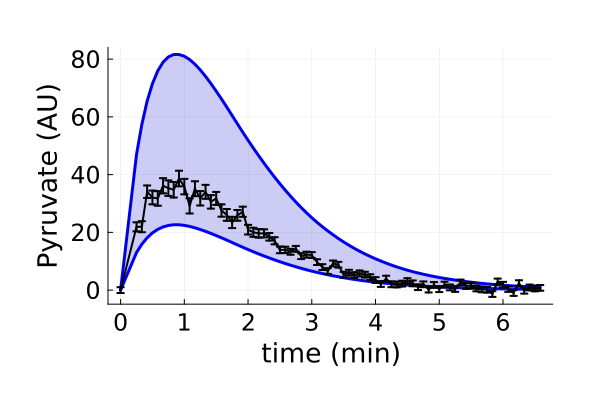

In [40]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"][:,end]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")

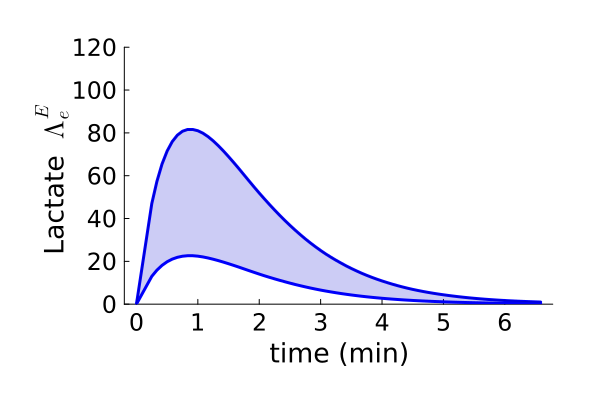

In [44]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Lactate  "*L"\Lambda^E_e", grid = false, ylim = (0,120))
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

savefig("RandPredIter2.svg")

pr

## MLE to obtain a good first guess for inference

In [45]:
global ScFm = 15;
p = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-1, 1e-6, 15, 50/(15*0.12), 5000/(15*0.12), 700/(15*0.12)];
ObjectFunctMECp_Multi_MLE(p)

UndefVarError: UndefVarError: `ObjectFunctMECp_Multi_MLE` not defined

In [42]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

In [43]:
i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMECp_Multi_MLE; SearchRange = vcat([(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 1:13], 
                                                                [(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 14:16]), # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*2, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.50 secs, 39 evals, 20 steps, improv/step: 0.350 (last = 0.3500), fitness=481.449288520
1.02 secs, 74 evals, 40 steps, improv/step: 0.375 (last = 0.4000), fitness=481.449288520
1.52 secs, 130 evals, 73 steps, improv/step: 0.479 (last = 0.6061), fitness=481.449288520
2.03 secs, 180 evals, 114 steps, improv/step: 0.395 (last = 0.2439), fitness=481.449288520
2.53 secs, 237 evals, 161 steps, improv/step: 0.373 (last = 0.3191), fitness=481.449288520
3.03 secs, 292 evals, 212 steps, improv/step: 0.377 (last = 0.3922), fitness=369.623830624
3.54 secs, 345 evals, 260 steps, improv/step: 0.365 (last = 0.3125), fitness=369.623830624
4.05 secs, 394 evals, 306 steps, improv/step: 0.343 (last = 0.2174), fitness=369.623830624
4.55 secs, 443 evals, 353 steps, improv/step: 0.351 (last = 0.4043), fitn

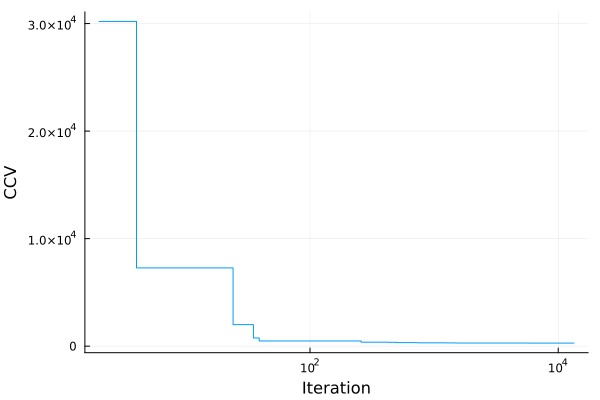

In [44]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
display(pl)

In [45]:
parfitT = zeros(16, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))
ppT = parfitT[:,bestPind]

16-element Vector{Float64}:
    48.0
    55.0
     0.00819589147100515
     0.018202953657741036
     0.05177175002467736
     0.34461414095538523
     1.1195162707336594
     0.7592576919992435
     0.8011187513630628
     0.006957402427568252
     0.828136857338892
     0.0008119227467460617
    15.0
   612.1514635914144
 22669.9681412222
   205.47415460035467

In [46]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMTRRCmp_ScF_Rand2.jld2", "FitsT",FitsT)
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_Rand2.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

In [46]:
ppT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_Rand2.jld2")["resMMat"][:,1]


16-element Vector{Float64}:
    48.0
    55.0
     0.00819589147100515
     0.018202953657741036
     0.05177175002467736
     0.34461414095538523
     1.1195162707336594
     0.7592576919992435
     0.8011187513630628
     0.006957402427568252
     0.828136857338892
     0.0008119227467460617
    15.0
   612.1514635914144
 22669.9681412222
   205.47415460035467

## Compute structure for Stan's initial guess

In [47]:
preTrans = zeros(13);

preTrans[1] = (ppT[3]-0.0055)/0.00275; 
preTrans[2] = (ppT[4]-0.0275)/0.01375;          
preTrans[3] = (ppT[5]-0.045)/0.0225;
preTrans[4] = (ppT[6]-0.45)/0.225;
preTrans[5] = (ppT[7]-0.95)/0.475;
preTrans[6] = (ppT[8]-0.95)/0.475;
preTrans[7] = (ppT[9]-0.95)/0.475;
preTrans[8] = (ppT[10]-0.0085)/0.00425;
preTrans[9] = (ppT[11]-0.95)/0.475;
preTrans[10] = (ppT[12]-0.0029)/0.00145;


preTrans[11] = (ppT[14]-650)/260;
preTrans[12] = (ppT[15]-16000)/6400;
preTrans[13] = (ppT[16]-550)/275;

In [48]:
function genStanInitDict(samps, names, chains)
    alltog = Array{Dict{String,Any},1}(undef,chains);
    for i in 1:(chains)
        global tmp = Dict{String, Any}()
        for j in 1:length(names)
            tmp[names[j]] = samps[j,i];
        end
        alltog[i] = tmp
    end

    return(alltog)
end

samps = hcat(preTrans,preTrans,preTrans,preTrans);
names = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

ini = genStanInitDict(samps, names, 4)

4-element Vector{Dict{String, Any}}:
 Dict("kbnE" => -0.36296413468982314, "LDH" => -1.2528212559987104, "kin" => 0.9803241712746003, "ki" => -0.256553984549701, "kunE" => -0.3134342076567099, "kpl" => -0.676148824891561, "NADH" => -0.14557129387917528, "kup" => -0.401562753685803, "kbp" => 0.35687635943928314, "kr" => -1.4400532781061643…)
 Dict("kbnE" => -0.36296413468982314, "LDH" => -1.2528212559987104, "kin" => 0.9803241712746003, "ki" => -0.256553984549701, "kunE" => -0.3134342076567099, "kpl" => -0.676148824891561, "NADH" => -0.14557129387917528, "kup" => -0.401562753685803, "kbp" => 0.35687635943928314, "kr" => -1.4400532781061643…)
 Dict("kbnE" => -0.36296413468982314, "LDH" => -1.2528212559987104, "kin" => 0.9803241712746003, "ki" => -0.256553984549701, "kunE" => -0.3134342076567099, "kpl" => -0.676148824891561, "NADH" => -0.14557129387917528, "kup" => -0.401562753685803, "kbp" => 0.35687635943928314, "kr" => -1.4400532781061643…)
 Dict("kbnE" => -0.36296413468982314, "LDH" =

## Inference

In [54]:
modelpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\HP_PyrLac_CompetitiveRepressionModel_FixedT1ScF.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrCompRepr_Rand2_Try1", model=Model, nchains =4,
            num_samples  = 2000, num_warmup = 1000, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 0.1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [57]:
rc, chns, cnames = stan(StanModel, dat, init = ini) 


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessingInference/ComputationalBayesianOED/tmp/PyrCompRepr_Rand2_Try1.stan', line 198, column 6 to column 133)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessi

Inference for Stan model: PyrCompRepr_Rand2_Try1_model
4 chains: each with iter=(2000,2000,2000,2000); warmup=(1000,1000,1000,1000); thin=(1,1,1,1); 12000 iterations saved.

Warmup took (208577, 223827, 214343, 195460) seconds, 234 hours total
Sampling took (423574, 473425, 447889, 435365) seconds, 495 hours total

                    Mean     MCSE   StdDev        5%       50%       95%    N_Eff  N_Eff/s    R_hat

lp__            -2.9e+02  4.3e-02  2.4e+00  -3.0e+02  -2.9e+02  -2.9e+02  3.2e+03  1.8e-03  1.0e+00
accept_stat__    9.5e-01  1.8e-03  1.1e-01   7.7e-01   9.9e-01   1.0e+00     3787  2.1e-03      1.0
stepsize__       6.5e-03  4.5e-04  2.0e-03   3.5e-03   6.4e-03   9.9e-03       19  1.1e-05      1.1
treedepth__      9.1e+00  6.1e-02  8.3e-01   8.0e+00   9.0e+00   1.0e+01      187  1.1e-04      1.0
n_leapfrog__     6.9e+02  2.9e+01  2.8e+02   2.6e+02   5.1e+02   1.0e+03       91  5.1e-05      1.0
divergent__      1.6e-02  1.6e-03  1.2e-01   0.0e+00   0.0e+00   0.0e+00     5662 

(0, [-291.474 0.798723 … 22106.6 383.219; -291.474 0.0 … 22106.6 383.219; … ; -293.642 0.989876 … 22062.4 150.041; -290.683 0.998183 … 22488.7 178.231;;; -288.178 2.96401e-9 … 22670.0 205.474; -288.178 0.0 … 22670.0 205.474; … ; -291.493 0.971454 … 23710.3 333.823; -290.555 0.980511 … 16083.0 243.945;;; -288.178 0.0067485 … 22670.0 205.474; -288.178 0.0 … 22670.0 205.474; … ; -289.514 0.9991 … 16872.3 171.246; -291.697 0.999101 … 14591.9 217.736;;; -290.764 0.999993 … 8126.34 230.124; -290.764 0.0 … 8126.34 230.124; … ; -295.537 0.998284 … 24814.1 217.607; -294.635 0.752443 … 6816.34 441.627], ["lp__", "accept_stat__", "stepsize__", "treedepth__", "n_leapfrog__", "divergent__", "energy__", "kin", "kpl", "kbn"  …  "theta.7", "theta.8", "theta.9", "theta.10", "theta.11", "theta.12", "theta.13", "inits.1", "inits.2", "inits.3"])

In [58]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PyrCompetitiveRepressionInferRes_Rand2_Try1.jld", "rc", rc, "chns", chns, "cnames", cnames)

In [59]:
poster = vcat(chns[1001:end, end-15:end, 1], chns[1001:end, end-15:end, 2], chns[1001:end, end-15:end, 3], chns[1001:end, end-15:end, 4])
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand2_Try1.jld", "poster", poster)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand2_Try1.csv", DataFrame(poster, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand2_Try1.csv"

In [49]:
poster = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand2_Try1.csv", DataFrame))

8000×16 Matrix{Float64}:
 48.0  55.0  0.00680441  0.0183187  …  15.0  732.059  16523.6   152.424
 48.0  55.0  0.00485537  0.0185318     15.0  784.532  14594.8   132.119
 48.0  55.0  0.00718702  0.018749      15.0  763.64   14011.3   178.327
 48.0  55.0  0.00635757  0.01825       15.0  386.008  16990.3   244.116
 48.0  55.0  0.00509064  0.0179866     15.0  277.452  16017.1   297.091
 48.0  55.0  0.0087811   0.0179725  …  15.0  757.038  15622.1   290.294
 48.0  55.0  0.00710889  0.0184599     15.0  564.794  10106.1   166.923
 48.0  55.0  0.00700904  0.0182743     15.0  369.796  17032.6   254.268
 48.0  55.0  0.00729289  0.0178489     15.0  268.652  15314.1   334.189
 48.0  55.0  0.00874897  0.0186495     15.0  395.524  20168.6   320.063
  ⋮                                 ⋱                             ⋮
 48.0  55.0  0.00639241  0.017856      15.0  137.109  11311.4   303.254
 48.0  55.0  0.00639241  0.017856      15.0  137.109  11311.4   303.254
 48.0  55.0  0.00615464  0.0178665     15.0

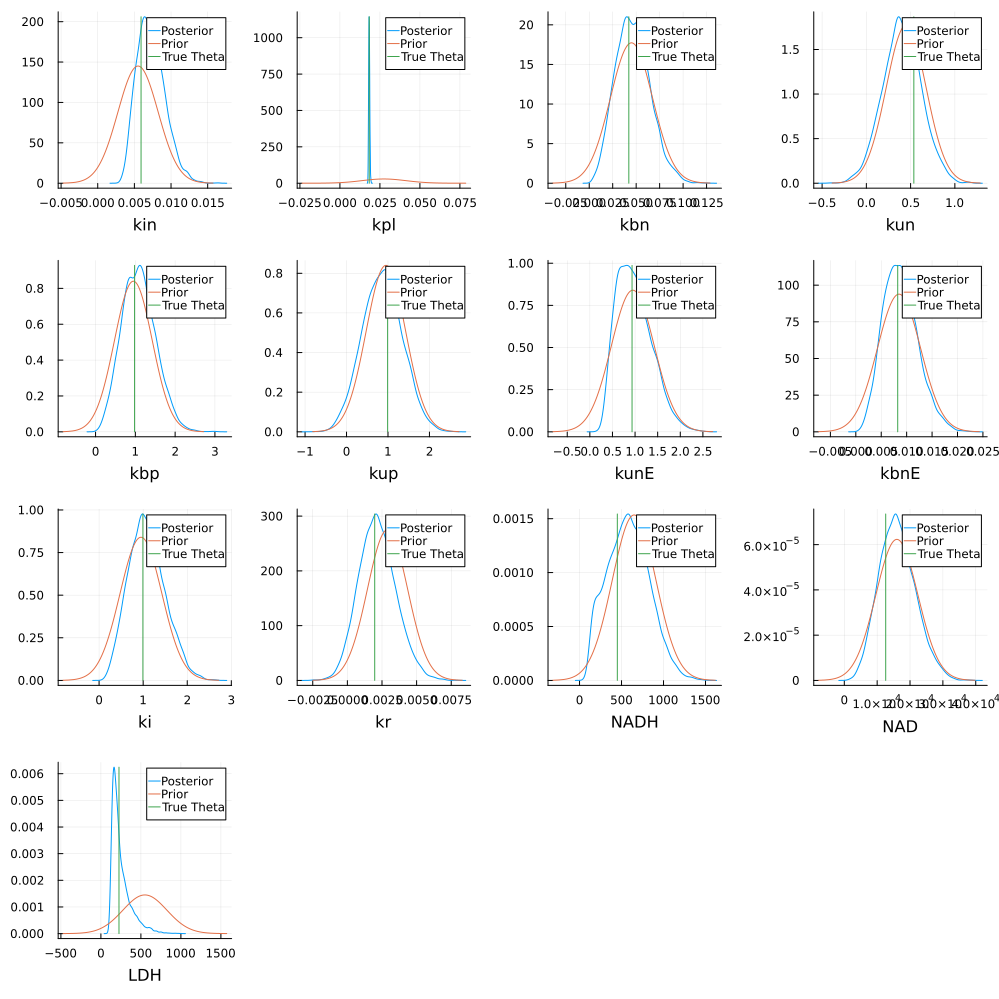

In [20]:
pp1 = plot(kde(poster[:,3]), label = "Posterior", xlabel = names[1])
plot!(Normal(0.0055, 0.00275), label = "Prior")
plot!([trueP[3], trueP[3]],[0, maximum(kde(poster[:,3]).density)], label = "True Theta")

pp2 = plot(kde(poster[:,4]), label = "Posterior", xlabel = names[2])
plot!(Normal(0.0275, 0.01375), label = "Prior")
plot!([trueP[4], trueP[4]],[0, maximum(kde(poster[:,4]).density)], label = "True Theta")

pp3 = plot(kde(poster[:,5]), label = "Posterior", xlabel = names[3])
plot!(Normal(0.045, 0.0225), label = "Prior")
plot!([trueP[5], trueP[5]],[0, maximum(kde(poster[:,5]).density)], label = "True Theta")

pp4 = plot(kde(poster[:,6]), label = "Posterior", xlabel = names[4])
plot!(Normal(0.45, 0.225), label = "Prior")
plot!([trueP[6], trueP[6]],[0, maximum(kde(poster[:,6]).density)], label = "True Theta")

pp5 = plot(kde(poster[:,7]), label = "Posterior", xlabel = names[5])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[7], trueP[7]],[0, maximum(kde(poster[:,7]).density)], label = "True Theta")

pp6 = plot(kde(poster[:,8]), label = "Posterior", xlabel = names[6])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[8], trueP[8]],[0, maximum(kde(poster[:,8]).density)], label = "True Theta")

pp7 = plot(kde(poster[:,9]), label = "Posterior", xlabel = names[7])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[9], trueP[9]],[0, maximum(kde(poster[:,9]).density)], label = "True Theta")

pp8 = plot(kde(poster[:,10]), label = "Posterior", xlabel = names[8])
plot!(Normal(0.0085, 0.00425), label = "Prior")
plot!([trueP[10], trueP[10]],[0, maximum(kde(poster[:,10]).density)], label = "True Theta")

pp9 = plot(kde(poster[:,11]), label = "Posterior", xlabel = names[9])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[11], trueP[11]],[0, maximum(kde(poster[:,11]).density)], label = "True Theta")

pp10 = plot(kde(poster[:,12]), label = "Posterior", xlabel = names[10])
plot!(Normal(0.0029, 0.00145), label = "Prior")
plot!([trueP[12], trueP[12]],[0, maximum(kde(poster[:,12]).density)], label = "True Theta")


pp11 = plot(kde(poster[:,14]), label = "Posterior", xlabel = names[11])
plot!(Normal(650, 260), label = "Prior")
plot!([InitsY0[1], InitsY0[1]],[0, maximum(kde(poster[:,14]).density)], label = "True Theta")

pp12 = plot(kde(poster[:,15]), label = "Posterior", xlabel = names[12])
plot!(Normal(16000, 6400), label = "Prior")
plot!([InitsY0[2], InitsY0[2]],[0, maximum(kde(poster[:,15]).density)], label = "True Theta")

pp13 = plot(kde(poster[:,16]), label = "Posterior", xlabel = names[13])
plot!(Normal(550, 275), label = "Prior")
plot!([InitsY0[3], InitsY0[3]],[0, maximum(kde(poster[:,16]).density)], label = "True Theta")

plot(pp1,pp2,pp3,pp4,pp5,pp6,pp7,pp8,pp9,pp10,pp11,pp12,pp13, size=(1000,1000))

In [21]:
-log(det(cov(hcat(poster[:,3:12], poster[:,14:end]))))

36.68004847188243

## Simulate Experiment Current Posterior

In [27]:
simsPoster = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,end,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPoster[i] = SimulsAll;
end

In [28]:
# Dims = Up/Down, Observable, Experiment
PostQuant = Array{Any}(undef,2,1,1);
lacPostSims = zeros(size(simsPoster[1])[1], 8000)
[lacPostSims[:,i] = simsPoster[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PostQuant[1,k,m] = [percentile(lacPostSims[j,:], 99.5) for j in 1:size(lacPostSims)[1]]; # Up
        PostQuant[2,k,m] = [percentile(lacPostSims[j,:], 0.5 ) for j in 1:size(lacPostSims)[1]]; # Down
    end
end


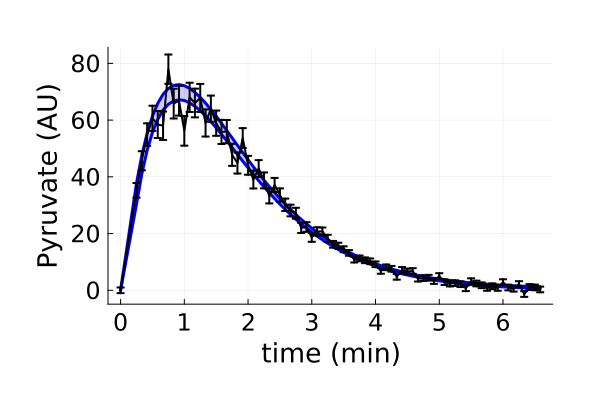

In [29]:
pr = plot(tsC2./60, PostQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PostQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PostQuant[1], fillrange=PostQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"][:,end]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")

## Compute Utility Function of Experiment

In [16]:
dat32mM = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ProcessedData\\4Mil_Dat.csv", DataFrame));
global tsC2 = dat32mM[:,1]
global ts = 0:tsC2[end];
global samps = convert.(Int, tsC2);
global sampsTh = abs.(poster[:,1:13]);
global sampsY0 = abs.(poster[:,14:end]);

In [17]:
CompRepUtil_Entro_OEDmc(PyrCons[3]/1000)

42.273174748803946

# Bayesian Inference 3

## Extract Data

In [50]:
mainpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\PseudoData\\";
i = 3;
paths = [mainpath*"CompRepr_Ran"*string(1)*"_Observables_Pyr"*(string(PyrCons[1]/1000))*"mM.csv",
         mainpath*"CompRepr_Ran"*string(2)*"_Observables_Pyr"*(string(PyrCons[2]/1000))*"mM.csv",
         mainpath*"CompRepr_Ran"*string(3)*"_Observables_Pyr"*(string(PyrCons[3]/1000))*"mM.csv"]

3-element Vector{String}:
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 74 bytes ⋯ "r_Ran1_Observables_Pyr4.9mM.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 75 bytes ⋯ "_Ran2_Observables_Pyr30.4mM.csv"
 "C:\\IBECPostDocDrive\\2024_01_16_" ⋯ 75 bytes ⋯ "_Ran3_Observables_Pyr10.4mM.csv"

In [51]:
Random.seed!(231549);
global dat = restructDatInfCompRep_FixedSF(paths, rand(Uniform(boundY0[1][1],boundY0[2][1])), rand(Uniform(boundY0[1][2],boundY0[2][2])), rand(Uniform(boundY0[1][3],boundY0[2][3])), 15)

Dict{String, Any} with 14 entries:
  "Means"  => [8820.0 54720.0 18720.0; 6679.61 41637.2 14221.8; … ; 5.9485 44.9…
  "stsl"   => [78 78 78]
  "obSta"  => [1 2]
  "sts"    => [0 0 0; 15 15 15; … ; 390 390 390; 395 395 395]
  "obser"  => 2
  "Y0us"   => [4900.0 30400.0 10400.0; 0.0 0.0 0.0; … ; 0.0 0.0 0.0; 8820.0 547…
  "ts"     => [1.0e-20 1.0e-20 1.0e-20; 1.0 1.0 1.0; … ; 394.0 394.0 394.0; 395…
  "itp"    => [0.0, 0.0, 0.0]
  "ncells" => [0 0 0]
  "stslm"  => 78
  "tml"    => 396
  "Erros"  => [1058.4 6566.4 2246.4; 801.553 4996.46 1706.62; … ; 1.0 5.39055 1…
  "m"      => 3
  "nts"    => [395 395 395]

## Prior Prediction

In [52]:
simsPrior = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,end,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPrior[i] = SimulsAll;
end

In [53]:
# Dims = Up/Down, Observable, Experiment
PriorQuant = Array{Any}(undef,2,1,1);
lacPirorSims = zeros(size(simsPrior[1])[1], 8000)
[lacPirorSims[:,i] = simsPrior[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PriorQuant[1,k,m] = [percentile(lacPirorSims[j,:], 99.5) for j in 1:size(lacPirorSims)[1]]; # Up
        PriorQuant[2,k,m] = [percentile(lacPirorSims[j,:], 0.5 ) for j in 1:size(lacPirorSims)[1]]; # Down
    end
end


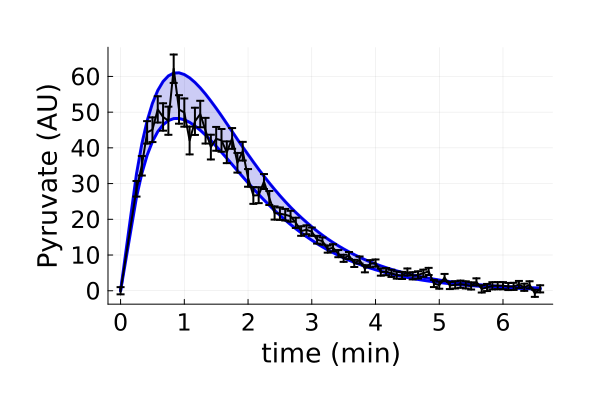

In [54]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"][:,end]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")

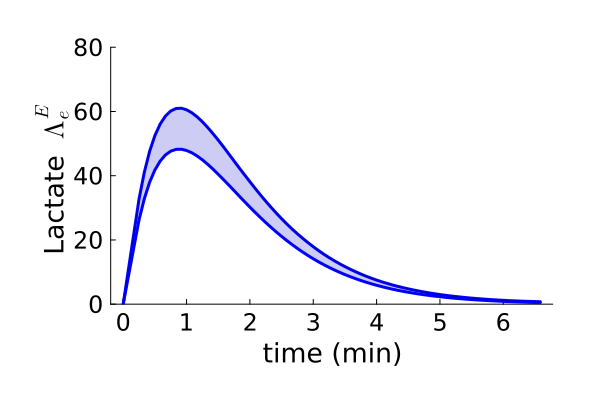

In [57]:
pr = plot(tsC2./60, PriorQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Lactate  "*L"\Lambda^E_e", grid = false, ylim = (0,80))
  plot!(tsC2./60, PriorQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PriorQuant[1], fillrange=PriorQuant[2], label="", color="blue3", fillalpha=0.2)

savefig("RandPredIter3.svg")

pr

## MLE to obtain a good first guess for inference

In [37]:
global ScFm = 15;
p = [48, 55, 0.044, 0.02, 0.02, 0.001, 0.01, 0.0003, 0.0001, 0.0002, 1e-1, 1e-6, 15, 50/(15*0.12), 5000/(15*0.12), 700/(15*0.12)];
ObjectFunctMECp_Multi_MLE(p)

6045.607305185953

In [39]:
Iters = 1;
CCsT = Array{Any}(undef,Iters);
FitsT = Array{Any}(undef,Iters);

In [40]:
i=1
fitness_progress_history = Array{Tuple{Int, Float64},1}()
callback = oc -> push!(fitness_progress_history, (num_func_evals(oc), best_fitness(oc)))

resM = bboptimize(ObjectFunctMECp_Multi_MLE; SearchRange = vcat([(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 1:13], 
                                                                [(minimum(abs.(poster[:,i])), maximum(abs.(poster[:,i]))) for i in 14:16]), # T1_X, T1_P, kin, kpl, kf, kr, a1, a2, a3, b1, b2, b3
        MaxTime = 60*3, method = :adaptive_de_rand_1_bin, 
        CallbackFunction = callback, CallbackInterval = 0.0)

CCsT[i] = fitness_progress_history;
FitsT[i] = resM;

Starting optimization with optimizer DiffEvoOpt{FitPopulation{Float64}, RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, RandomBound{ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
0.50 secs, 34 evals, 18 steps, improv/step: 0.500 (last = 0.5000), fitness=660.998855922
1.01 secs, 72 evals, 38 steps, improv/step: 0.500 (last = 0.5000), fitness=530.187669539
1.51 secs, 114 evals, 65 steps, improv/step: 0.462 (last = 0.4074), fitness=432.791221205
2.02 secs, 157 evals, 93 steps, improv/step: 0.452 (last = 0.4286), fitness=432.791221205
2.52 secs, 201 evals, 132 steps, improv/step: 0.394 (last = 0.2564), fitness=432.791221205
3.02 secs, 248 evals, 172 steps, improv/step: 0.436 (last = 0.5750), fitness=432.791221205
3.53 secs, 290 evals, 207 steps, improv/step: 0.435 (last = 0.4286), fitness=432.791221205
4.03 secs, 332 evals, 244 steps, improv/step: 0.422 (last = 0.3514), fitness=431.141633268
4.54 secs, 375 evals, 284 steps, improv/step: 0.391 (last = 0.2000), fitne

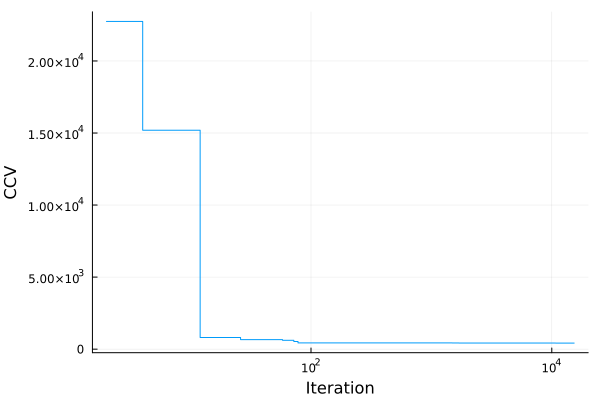

In [41]:
# Plot convergence curve
pl=plot(CCsT[1], xaxis=:log, linetype=:step, label = "", xlabel = "Iteration", ylabel = "CCV")
display(pl)

In [42]:
parfitT = zeros(16, Iters);
for i in 1:Iters
    parfitT[:,i] = best_candidate(FitsT[i]);
end
bestPind = findfirst([CCsT[i][end][2] for i in 1:length(CCsT)] .== minimum([CCsT[i][end][2] for i in 1:length(CCsT)]))
ppT = parfitT[:,bestPind]

16-element Vector{Float64}:
    48.0
    55.0
     0.012614422428289711
     0.018281050348628033
     0.10985352890947633
     0.5620718766575693
     2.134237314852346
     0.19469153786972995
     1.0448907200740478
     0.020013814728173724
     1.0782859296621934
     2.1007095006517055e-5
    15.0
   874.7346972049069
 27979.62352589971
   190.01394330747638

In [43]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMTRRCmp_ScF_Rand3.jld2", "FitsT",FitsT)
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_Rand3.jld2", 
        "resMMat",parfitT, "CCsT", CCsT)

In [25]:
ppT = JLD2.load("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\MLEResults\\resMVectTRRCmp_ScF_Rand3.jld2")["resMMat"][:,1]


16-element Vector{Float64}:
    48.0
    55.0
     0.012614422428289711
     0.018281050348628033
     0.10985352890947633
     0.5620718766575693
     2.134237314852346
     0.19469153786972995
     1.0448907200740478
     0.020013814728173724
     1.0782859296621934
     2.1007095006517055e-5
    15.0
   874.7346972049069
 27979.62352589971
   190.01394330747638

## Compute structure for Stan's initial guess

In [45]:
preTrans = zeros(13);

preTrans[1] = (ppT[3]-0.0055)/0.00275; 
preTrans[2] = (ppT[4]-0.0275)/0.01375;          
preTrans[3] = (ppT[5]-0.045)/0.0225;
preTrans[4] = (ppT[6]-0.45)/0.225;
preTrans[5] = (ppT[7]-0.95)/0.475;
preTrans[6] = (ppT[8]-0.95)/0.475;
preTrans[7] = (ppT[9]-0.95)/0.475;
preTrans[8] = (ppT[10]-0.0085)/0.00425;
preTrans[9] = (ppT[11]-0.95)/0.475;
preTrans[10] = (ppT[12]-0.0029)/0.00145;


preTrans[11] = (ppT[14]-650)/260;
preTrans[12] = (ppT[15]-16000)/6400;
preTrans[13] = (ppT[16]-550)/275;

In [46]:
function genStanInitDict(samps, names, chains)
    alltog = Array{Dict{String,Any},1}(undef,chains);
    for i in 1:(chains)
        global tmp = Dict{String, Any}()
        for j in 1:length(names)
            tmp[names[j]] = samps[j,i];
        end
        alltog[i] = tmp
    end

    return(alltog)
end

samps = hcat(preTrans,preTrans,preTrans,preTrans);
names = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

ini = genStanInitDict(samps, names, 4)

4-element Vector{Dict{String, Any}}:
 Dict("kbnE" => 2.7091328772173466, "LDH" => -1.3090402061546313, "kin" => 2.587062701196259, "ki" => 0.27007564139409146, "kunE" => 0.1997699369979955, "kpl" => -0.670469065554325, "NADH" => 0.8643642200188726, "kup" => -1.5901230781689897, "kbp" => 2.4931311891628343, "kr" => -1.9855123482713677…)
 Dict("kbnE" => 2.7091328772173466, "LDH" => -1.3090402061546313, "kin" => 2.587062701196259, "ki" => 0.27007564139409146, "kunE" => 0.1997699369979955, "kpl" => -0.670469065554325, "NADH" => 0.8643642200188726, "kup" => -1.5901230781689897, "kbp" => 2.4931311891628343, "kr" => -1.9855123482713677…)
 Dict("kbnE" => 2.7091328772173466, "LDH" => -1.3090402061546313, "kin" => 2.587062701196259, "ki" => 0.27007564139409146, "kunE" => 0.1997699369979955, "kpl" => -0.670469065554325, "NADH" => 0.8643642200188726, "kup" => -1.5901230781689897, "kbp" => 2.4931311891628343, "kr" => -1.9855123482713677…)
 Dict("kbnE" => 2.7091328772173466, "LDH" => -1.309040206154

In [47]:
ini[1]

Dict{String, Any} with 13 entries:
  "kbnE" => 2.70913
  "LDH"  => -1.30904
  "kin"  => 2.58706
  "ki"   => 0.270076
  "kunE" => 0.19977
  "kpl"  => -0.670469
  "NADH" => 0.864364
  "kup"  => -1.59012
  "kbp"  => 2.49313
  "kr"   => -1.98551
  "NAD"  => 1.87182
  "kun"  => 0.498097
  "kbn"  => 2.88238

## Inference

In [49]:
modelpath = "C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\HP_PyrLac_CompetitiveRepressionModel_FixedT1ScF.stan";
stream = open(modelpath,"r");
Model = read(stream,String);
close(stream);

StanModel = Stanmodel(name="PyrCompRepr_Rand3_Try1", model=Model, nchains =4,
            num_samples  = 2000, num_warmup = 1000, printsummary=true);
StanModel.method.save_warmup = true;
StanModel.method.adapt.delta = 0.85;
StanModel.method.algorithm.stepsize = 0.1;
StanModel.method.algorithm.engine.max_depth=10;
StanModel.method.algorithm.stepsize_jitter = 0.5;

In [50]:
rc, chns, cnames = stan(StanModel, dat, init = ini) 


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessingInference/ComputationalBayesianOED/tmp/PyrCompRepr_Rand3_Try1.stan', line 198, column 6 to column 133)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: CVode(cvodes_mem, t_final, nv_state_, &t_init, CV_NORMAL) failed with error flag -1: 
The solver took mxstep internal steps but could not reach tout. (in 'c:/IBECPostDocDrive/2024_01_16_NCvsKR/DataProcessi

Inference for Stan model: PyrCompRepr_Rand3_Try1_model
4 chains: each with iter=(2000,2000,2000,2000); warmup=(1000,1000,1000,1000); thin=(1,1,1,1); 12000 iterations saved.

Warmup took (309836, 274403, 272729, 274520) seconds, 314 hours total
Sampling took (617887, 560003, 652539, 580997) seconds, 670 hours total

                    Mean     MCSE   StdDev        5%       50%       95%    N_Eff  N_Eff/s    R_hat

lp__            -4.3e+02  4.3e-02  2.5e+00  -4.3e+02  -4.3e+02  -4.3e+02  3.3e+03  1.4e-03  1.0e+00
accept_stat__    9.3e-01  2.7e-03  1.4e-01   7.0e-01   9.8e-01      1.00     2678  1.1e-03      1.0
stepsize__       7.9e-03  5.8e-04  2.4e-03   4.2e-03   7.8e-03     0.012       17  7.2e-06      1.1
treedepth__      8.8e+00  8.4e-02  9.7e-01   8.0e+00   9.0e+00        10      131  5.5e-05      1.0
n_leapfrog__     5.9e+02  2.8e+01  2.7e+02   2.6e+02   5.1e+02      1023       90  3.7e-05      1.0
divergent__      1.9e-02  2.2e-03  1.4e-01   0.0e+00   0.0e+00      0.00     3744 

(0, [-441.429 0.00221829 … 27979.6 190.014; -441.429 0.0 … 27979.6 190.014; … ; -429.811 0.888885 … 12534.3 207.684; -427.435 0.822438 … 22369.5 188.312;;; -441.429 0.109973 … 27979.6 190.014; -441.429 0.0 … 27979.6 190.014; … ; -430.095 0.945122 … 11947.6 274.673; -431.361 0.941212 … 23003.0 391.318;;; -442.187 0.16468 … 29024.3 191.696; -442.187 0.0 … 29024.3 191.696; … ; -430.162 0.890827 … 20933.0 148.007; -428.96 0.980198 … 16644.7 196.467;;; -441.429 9.68854e-11 … 27979.6 190.014; -441.429 0.0 … 27979.6 190.014; … ; -429.335 0.988033 … 23922.6 420.214; -429.474 0.650194 … 21109.1 387.405], ["lp__", "accept_stat__", "stepsize__", "treedepth__", "n_leapfrog__", "divergent__", "energy__", "kin", "kpl", "kbn"  …  "theta.7", "theta.8", "theta.9", "theta.10", "theta.11", "theta.12", "theta.13", "inits.1", "inits.2", "inits.3"])

In [51]:
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PyrCompetitiveRepressionInferRes_Rand3_Try1.jld", "rc", rc, "chns", chns, "cnames", cnames)

In [52]:
poster = vcat(chns[1001:end, end-15:end, 1], chns[1001:end, end-15:end, 2], chns[1001:end, end-15:end, 3], chns[1001:end, end-15:end, 4])
JLD2.save("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand3_Try1.jld", "poster", poster)
CSV.write("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand3_Try1.csv", DataFrame(poster, :auto))

"C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand3_Try1.csv"

In [26]:
poster = Matrix(CSV.read("C:\\IBECPostDocDrive\\2024_01_16_NCvsKR\\DataProcessingInference\\ComputationalBayesianOED\\Results\\PosteriorCompetitiveRepression_Rand3_Try1.csv", DataFrame))

8000×16 Matrix{Float64}:
 48.0  55.0  0.0113879   0.0180015  …  15.0  704.462  19640.1   192.1
 48.0  55.0  0.00810903  0.0179668     15.0  638.57   15050.7   174.893
 48.0  55.0  0.00837009  0.0184189     15.0  697.438  23046.8   238.897
 48.0  55.0  0.00663558  0.0179486     15.0  652.935   8923.61  204.568
 48.0  55.0  0.0086822   0.0181997     15.0  458.542  21392.8   318.371
 48.0  55.0  0.0089315   0.0178259  …  15.0  683.397  24394.6   228.293
 48.0  55.0  0.00915703  0.0176292     15.0  883.608  21989.4   192.768
 48.0  55.0  0.00689547  0.0188032     15.0  487.737  11335.1   167.455
 48.0  55.0  0.00652304  0.0188192     15.0  502.173  14840.5   143.669
 48.0  55.0  0.00512478  0.0184045     15.0  736.785  22813.4   137.44
  ⋮                                 ⋱                             ⋮
 48.0  55.0  0.00721585  0.0180477     15.0  706.691  10309.4   217.704
 48.0  55.0  0.00544292  0.01817       15.0  557.863  10502.5   161.808
 48.0  55.0  0.00828924  0.0183915     15.0  7

In [29]:
namess = ["kin","kpl","kbn","kun","kbp","kup","kunE","kbnE","ki","kr","NADH","NAD","LDH"];

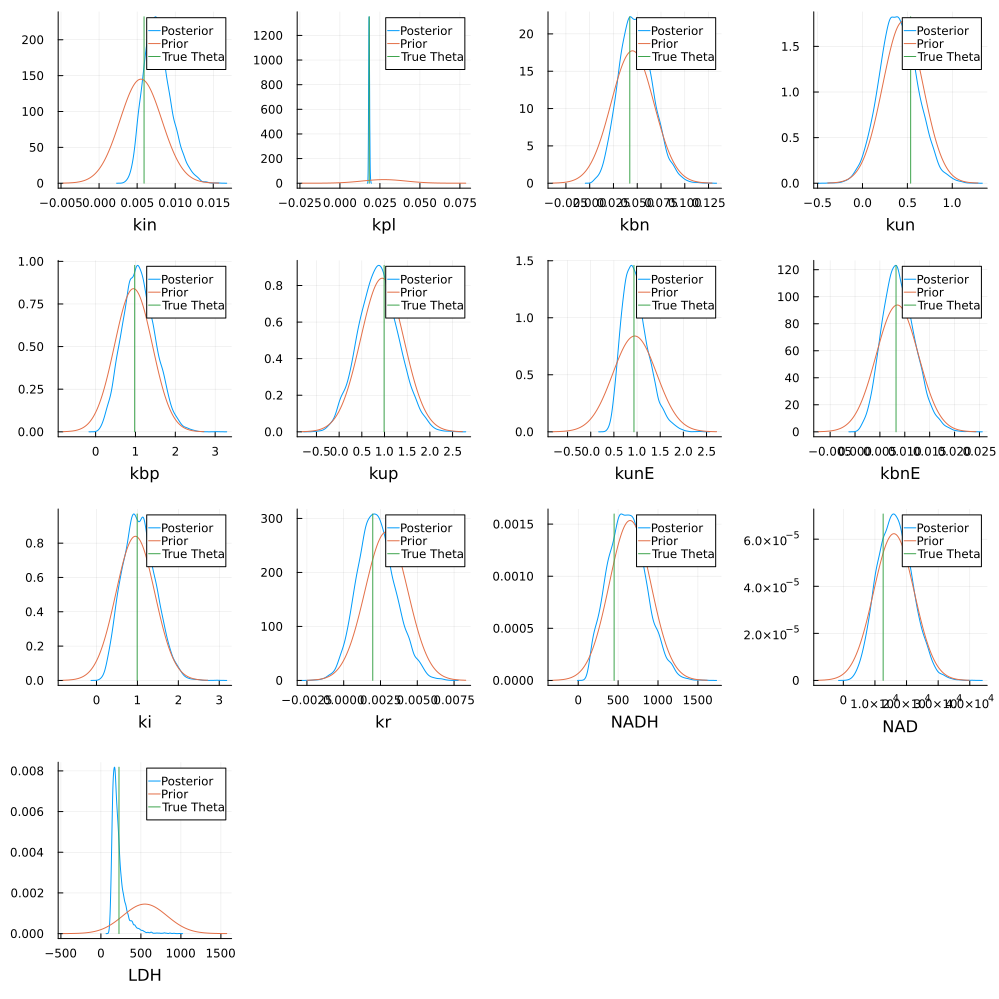

In [32]:
pp1 = plot(kde(poster[:,3]), label = "Posterior", xlabel = namess[1])
plot!(Normal(0.0055, 0.00275), label = "Prior")
plot!([trueP[3], trueP[3]],[0, maximum(kde(poster[:,3]).density)], label = "True Theta")

pp2 = plot(kde(poster[:,4]), label = "Posterior", xlabel = namess[2])
plot!(Normal(0.0275, 0.01375), label = "Prior")
plot!([trueP[4], trueP[4]],[0, maximum(kde(poster[:,4]).density)], label = "True Theta")

pp3 = plot(kde(poster[:,5]), label = "Posterior", xlabel = namess[3])
plot!(Normal(0.045, 0.0225), label = "Prior")
plot!([trueP[5], trueP[5]],[0, maximum(kde(poster[:,5]).density)], label = "True Theta")

pp4 = plot(kde(poster[:,6]), label = "Posterior", xlabel = namess[4])
plot!(Normal(0.45, 0.225), label = "Prior")
plot!([trueP[6], trueP[6]],[0, maximum(kde(poster[:,6]).density)], label = "True Theta")

pp5 = plot(kde(poster[:,7]), label = "Posterior", xlabel = namess[5])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[7], trueP[7]],[0, maximum(kde(poster[:,7]).density)], label = "True Theta")

pp6 = plot(kde(poster[:,8]), label = "Posterior", xlabel = namess[6])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[8], trueP[8]],[0, maximum(kde(poster[:,8]).density)], label = "True Theta")

pp7 = plot(kde(poster[:,9]), label = "Posterior", xlabel = namess[7])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[9], trueP[9]],[0, maximum(kde(poster[:,9]).density)], label = "True Theta")

pp8 = plot(kde(poster[:,10]), label = "Posterior", xlabel = namess[8])
plot!(Normal(0.0085, 0.00425), label = "Prior")
plot!([trueP[10], trueP[10]],[0, maximum(kde(poster[:,10]).density)], label = "True Theta")

pp9 = plot(kde(poster[:,11]), label = "Posterior", xlabel = namess[9])
plot!(Normal(0.95, 0.475), label = "Prior")
plot!([trueP[11], trueP[11]],[0, maximum(kde(poster[:,11]).density)], label = "True Theta")

pp10 = plot(kde(poster[:,12]), label = "Posterior", xlabel = namess[10])
plot!(Normal(0.0029, 0.00145), label = "Prior")
plot!([trueP[12], trueP[12]],[0, maximum(kde(poster[:,12]).density)], label = "True Theta")


pp11 = plot(kde(poster[:,14]), label = "Posterior", xlabel = namess[11])
plot!(Normal(650, 260), label = "Prior")
plot!([InitsY0[1], InitsY0[1]],[0, maximum(kde(poster[:,14]).density)], label = "True Theta")

pp12 = plot(kde(poster[:,15]), label = "Posterior", xlabel = namess[12])
plot!(Normal(16000, 6400), label = "Prior")
plot!([InitsY0[2], InitsY0[2]],[0, maximum(kde(poster[:,15]).density)], label = "True Theta")

pp13 = plot(kde(poster[:,16]), label = "Posterior", xlabel = namess[13])
plot!(Normal(550, 275), label = "Prior")
plot!([InitsY0[3], InitsY0[3]],[0, maximum(kde(poster[:,16]).density)], label = "True Theta")

plot(pp1,pp2,pp3,pp4,pp5,pp6,pp7,pp8,pp9,pp10,pp11,pp12,pp13, size=(1000,1000))

In [55]:
-log(det(cov(hcat(poster[:,3:12], poster[:,14:end]))))

39.728643552247405

## Simulate Experiment Current Posterior

In [34]:
simsPoster = Array{Any}(undef, 8000);


for i in 1:8000
    tsC2 = dat["sts"][:,end];
    ts = 0:tsC2[end];
    ivss = [dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, 0, poster[i,14], poster[i,15], poster[i,16], 0, 0, 0, 0, 0, dat["Means"][1,end,1]/(sampsTh[i,end]*0.12), 0, dat["Means"][1,end,1]];;
    samps = convert.(Int, tsC2);

    SimulsAll, SimulsAll2, SimulsAll3 = PyruvateHP_NMR_SolveAllCp(ts, vcat(poster[i,1:13], 0), ivss, samps);

    simsPoster[i] = SimulsAll;
end

In [35]:
# Dims = Up/Down, Observable, Experiment
PostQuant = Array{Any}(undef,2,1,1);
lacPostSims = zeros(size(simsPoster[1])[1], 8000)
[lacPostSims[:,i] = simsPoster[i][:,13,1] for i in 1:8000 ];

for k in 1:1
    for m in 1:1
        PostQuant[1,k,m] = [percentile(lacPostSims[j,:], 99.5) for j in 1:size(lacPostSims)[1]]; # Up
        PostQuant[2,k,m] = [percentile(lacPostSims[j,:], 0.5 ) for j in 1:size(lacPostSims)[1]]; # Down
    end
end


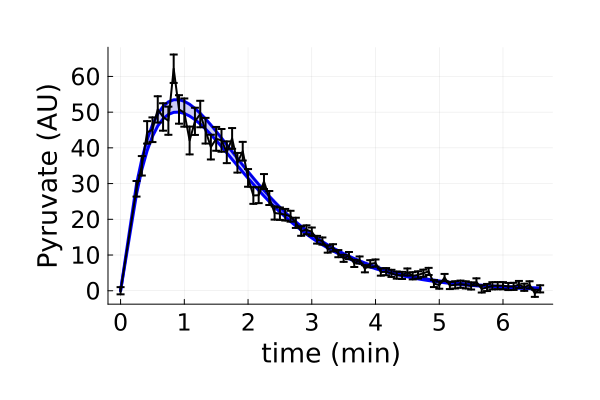

In [36]:
pr = plot(tsC2./60, PostQuant[1], label = "", color = "blue", linewidth = 3,
    margin=10Plots.mm,xtickfont=font(16), ytickfont=font(16), guidefont=font(18), titlefont=font(18),
    xlabel = "time (min)", ylabel = "Pyruvate (AU)")
  plot!(tsC2./60, PostQuant[2], label = "", color = "blue", linewidth = 3)
  plot!(tsC2./60, PostQuant[1], fillrange=PostQuant[2], label="", color="blue3", fillalpha=0.2)

  plot!(dat["sts"][:,end]./60, dat["Means"][:,end,2], yerror = dat["Erros"][:,end,2], linewidth = 2, colour = "black", label = "")